# 사고 데이터 불러오기

In [1]:
import pandas as pd

acc = pd.read_csv('/home/user/jin_jb/DTG/DATA/2019_TMC_T_W_ACC_INFO_GPS.csv')

acc['ACC_YMD'] = pd.to_datetime(acc['ACC_YMD'], format='%Y%m%d')

# 'ACC_YM'을 기준으로 데이터 정렬
acc = acc.sort_values(by='ACC_YMD')

# 정렬된 데이터의 처음 몇 줄 확인
acc = acc.reset_index(drop=True)

# DAY_CD 일요일: 1, 월요일: 2

/tmp/ipykernel_455418/2945952459.py:3: DtypeWarning: Columns (10) have mixed types. Specify dtype option on import or set low_memory=False.
  acc = pd.read_csv('/home/user/jin_jb/DTG/DATA/2019_TMC_T_W_ACC_INFO_GPS.csv')


# 발생년월일, 발생시간, 요일, 법정동코드, 날씨기록, 사고심각도, 사망자수, 중상자수, 경상자수, 부상자수, 경도, 위도

##### WEA_STA_CD 기상_상태_코드 01 맑음   1 
##### WEA_STA_CD 기상_상태_코드 02 흐림   2 
##### WEA_STA_CD 기상_상태_코드 03 비   3 
##### WEA_STA_CD 기상_상태_코드 04 안개   4 
##### WEA_STA_CD 기상_상태_코드 05 눈   5 
##### WEA_STA_CD 기상_상태_코드 99 기타   6 

In [2]:
acc = acc[['ACC_YMD','ACC_TME','DAY_CD','BJD_CD','WEA_STA_CD','ACC_GRD_CD','DEATH_CNT','SERI_CNT','SLTWD_CNT','WND_CNT','lon','lat']]

# 시간변수 추가

In [3]:
# ACC_TME를 문자열로 변환하고 HH:MM 형식으로 포맷팅
acc['ACC_TME_STR'] = acc['ACC_TME'].apply(lambda x: f"{str(x).zfill(4)[:2]}:{str(x).zfill(4)[2:]}")

# 시간만 추출하여 새로운 열 생성
acc['HOUR'] = acc['ACC_TME_STR'].str.split(':').str[0].astype(int)

# ACC_TME 열 제거
acc.drop('ACC_TME', axis=1, inplace=True)

# HOUR 열을 원하는 위치로 이동
# 여기서는 HOUR 열을 기존 ACC_TME 열이 있던 위치로 이동합니다.
hour_column = acc.pop('HOUR')
acc.insert(1, 'HOUR', hour_column)

acc.drop('ACC_TME_STR', axis=1, inplace=True)
acc


,ACC_YMD,HOUR,DAY_CD,BJD_CD,WEA_STA_CD,ACC_GRD_CD,DEATH_CNT,SERI_CNT,SLTWD_CNT,WND_CNT,lon,lat
0,2019-01-01,14,3,4.213031e+09,1,3,0,0,1,0,128.025067,37.438340
1,2019-01-01,12,3,4.283035e+09,1,3,0,0,2,0,128.607088,38.147351
2,2019-01-01,20,3,4.215011e+09,1,3,0,0,1,0,128.887905,37.757225
3,2019-01-01,6,3,2.826011e+09,1,2,0,1,0,0,126.694418,37.593666
4,2019-01-01,22,3,4.122025e+09,1,3,0,0,1,0,126.931567,36.983645
...,...,...,...,...,...,...,...,...,...,...,...,...
229595,2019-12-31,19,3,4.159014e+09,1,3,0,0,3,2,127.096095,37.177990
229596,2019-12-31,8,3,2.823710e+09,1,2,0,1,0,0,126.707165,37.487476
229597,2019-12-31,13,3,3.020012e+09,1,2,0,1,7,0,127.338581,36.365049
229598,2019-12-31,18,3,1.159010e+09,1,3,0,0,1,0,126.961778,37.507370


# 대전시 법정동 코드 필터링 (30~으로 시작)

In [4]:
import pandas as pd

daejeon_data = acc[acc['BJD_CD'].astype(str).str.startswith('30')]

daejeon_data

,ACC_YMD,HOUR,DAY_CD,BJD_CD,WEA_STA_CD,ACC_GRD_CD,DEATH_CNT,SERI_CNT,SLTWD_CNT,WND_CNT,lon,lat
24,2019-01-01,18,3,3.020014e+09,2,4,0,0,0,1,127.313203,36.391300
27,2019-01-01,18,3,3.017011e+09,1,3,0,0,2,0,127.379281,36.355766
51,2019-01-01,13,3,3.014010e+09,1,3,0,0,1,0,127.415028,36.333411
201,2019-01-01,12,3,3.011010e+09,1,2,0,1,0,0,127.454109,36.306999
214,2019-01-01,20,3,3.017011e+09,1,2,0,1,0,0,127.385080,36.345981
...,...,...,...,...,...,...,...,...,...,...,...,...
229395,2019-12-31,20,3,3.014011e+09,1,2,0,1,0,0,127.435187,36.316078
229530,2019-12-31,16,3,3.017011e+09,1,3,0,0,1,0,127.401734,36.351423
229540,2019-12-31,15,3,3.011011e+09,1,2,0,1,1,0,127.441801,36.351296
229581,2019-12-31,22,3,3.020014e+09,1,2,0,1,0,0,127.311831,36.396221


# 년월일시간 순으로 재정렬(8337개) 중상자, 경상자, 부상자를 전부 더해서 WND_CNT(Wounded Count)부상자열로 나타냄

In [5]:
import pandas as pd

# ACC_YMD와 HOUR 기준으로 정렬
dj_acc= daejeon_data.sort_values(by=['ACC_YMD', 'HOUR'])

# 인덱스 재설정
dj_acc.reset_index(drop=True, inplace=True)

# 'SERI_CNT', 'SLTWD_CNT', 'WND_CNT' 값을 합쳐서 'WND_CNT'에 저장
dj_acc['WND_CNT'] = dj_acc['SERI_CNT'] + dj_acc['SLTWD_CNT'] + dj_acc['WND_CNT']

# 'SERI_CNT'와 'SLTWD_CNT' 열을 제거
dj_acc.drop(['SERI_CNT', 'SLTWD_CNT'], axis=1, inplace=True)



In [6]:
dj_acc

,ACC_YMD,HOUR,DAY_CD,BJD_CD,WEA_STA_CD,ACC_GRD_CD,DEATH_CNT,WND_CNT,lon,lat
0,2019-01-01,3,3,3.020013e+09,1,3,0,1,127.372955,36.407769
1,2019-01-01,12,3,3.011010e+09,1,2,0,1,127.454109,36.306999
2,2019-01-01,13,3,3.014010e+09,1,3,0,1,127.415028,36.333411
3,2019-01-01,13,3,3.020011e+09,1,3,0,1,127.332033,36.351625
4,2019-01-01,18,3,3.020014e+09,2,4,0,1,127.313203,36.391300
...,...,...,...,...,...,...,...,...,...,...
8332,2019-12-31,20,3,3.014011e+09,1,2,0,1,127.435187,36.316078
8333,2019-12-31,22,3,3.020011e+09,1,3,0,3,127.346471,36.348741
8334,2019-12-31,22,3,3.023012e+09,1,3,0,3,127.420927,36.427734
8335,2019-12-31,22,3,3.020014e+09,1,2,0,1,127.311831,36.396221


In [7]:
spot = dj_acc[['lon','lat']]
spot

,lon,lat
0,127.372955,36.407769
1,127.454109,36.306999
2,127.415028,36.333411
3,127.332033,36.351625
4,127.313203,36.391300
...,...,...
8332,127.435187,36.316078
8333,127.346471,36.348741
8334,127.420927,36.427734
8335,127.311831,36.396221


# 요일별 사고량

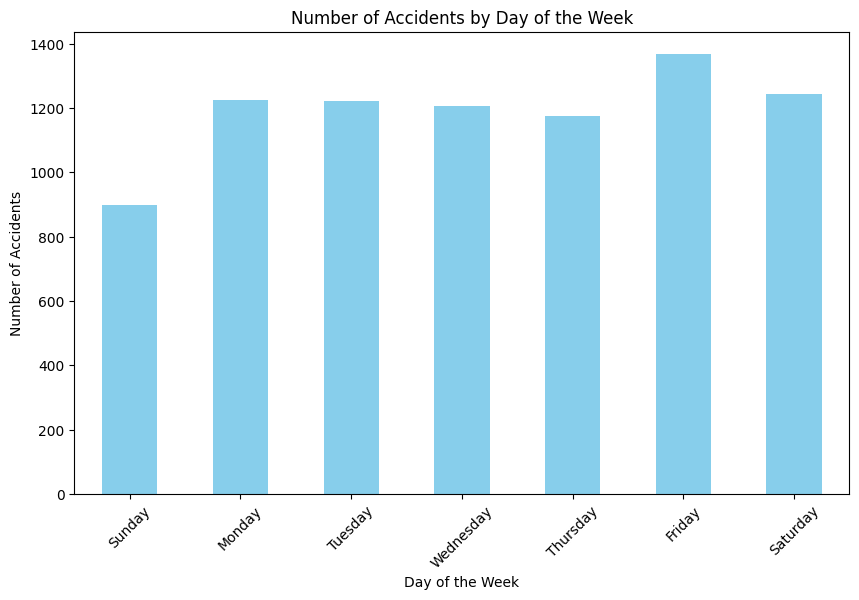

In [12]:
import matplotlib.pyplot as plt
import seaborn as sns

# 요일별 사고 횟수 계산
accidents_by_day = dj_acc['DAY_CD'].value_counts().sort_index()

# 요일별 사고 횟수 그래프로 표시
plt.figure(figsize=(10, 6))
accidents_by_day.plot(kind='bar', color='skyblue')
plt.xlabel('Day of the Week')
plt.ylabel('Number of Accidents')
plt.title('Number of Accidents by Day of the Week')
plt.xticks(ticks=range(7), labels=['Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday'], rotation=45)
plt.show()

# 대전시 법정동 경계 데이터 불러오기

In [14]:
import geopandas as gpd

file_path = '/home/user/jin_jb/DTG/DATA/LSMD_ADM_SECT_UMD_대전/LSMD_ADM_SECT_UMD_30_202312.shp'

gdf = gpd.read_file(file_path, encoding = 'cp949')

gdf

,EMD_CD,COL_ADM_SE,EMD_NM,SGG_OID,geometry
0,30110101,30110,원동,1476,"POLYGON ((127.43429 36.32904, 127.43431 36.329..."
1,30110102,30110,인동,1477,"POLYGON ((127.43909 36.32427, 127.43898 36.324..."
2,30110103,30110,효동,1478,"POLYGON ((127.44155 36.31926, 127.44162 36.319..."
3,30110104,30110,천동,1479,"POLYGON ((127.44675 36.31952, 127.44680 36.319..."
4,30110105,30110,가오동,1480,"POLYGON ((127.45415 36.31216, 127.45425 36.312..."
...,...,...,...,...,...
172,30230122,30230,부수동,1648,"POLYGON ((127.47616 36.44571, 127.47677 36.445..."
173,30230123,30230,황호동,1649,"POLYGON ((127.50279 36.45550, 127.50280 36.455..."
174,30230124,30230,삼정동,1650,"POLYGON ((127.46258 36.45616, 127.46329 36.455..."
175,30230125,30230,미호동,1651,"POLYGON ((127.48423 36.47580, 127.48428 36.475..."


# 사고데이터와 법정동 데이터 공간 조인

In [15]:
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point


# 교통사고 데이터의 공간 데이터 포인트 생성
dj_acc['geometry'] = dj_acc.apply(
    lambda row: Point(row['lon'], row['lat']), axis=1)
traffic_accident_gdf = gpd.GeoDataFrame(dj_acc, geometry='geometry')

# 공간 조인 수행
acc_gdf = gpd.sjoin(traffic_accident_gdf, gdf, how='left', predicate='within')


/tmp/ipykernel_455418/2283567578.py:12: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: None
Right CRS: GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84" ...

  acc_gdf = gpd.sjoin(traffic_accident_gdf, gdf, how='left', predicate='within')


<!-- 11대위험운전 count
월별 11대위험운전 count and drill-down
-> 가장 높은 달 추출 후 11대 위험운전 비교
(어떤 11위험운전이 있는지,
11대 위험운전 중 많은 것 추출 후 roll-up해서 전체 11대 위험운전과 비교
roll-up했을 때 )

(주말,평일의 차이가 있는지,
있다면 주말,평일 roll-up -> 전반적인 결과 도출
차이가 있다거나, 없다거나)

시간대별 차이가 있는지,
있다면 시간대별 roll-up -> 전반적인 결과 도출
차이가 있다면 있는 시간대 drill-down해도 되고 안해도 되고)

가장 높은 달 교통사고량 drill-down

구->동 

11대 위험운전과 join후 교통사고량과 위험운전과의 상관관계 분석 -->

In [16]:
acc_gdf

,ACC_YMD,HOUR,DAY_CD,BJD_CD,WEA_STA_CD,ACC_GRD_CD,DEATH_CNT,WND_CNT,lon,lat,geometry,index_right,EMD_CD,COL_ADM_SE,EMD_NM,SGG_OID
0,2019-01-01,3,3,3.020013e+09,1,3,0,1,127.372955,36.407769,POINT (127.37296 36.40777),126.0,30200129,30200,방현동,1602.0
1,2019-01-01,12,3,3.011010e+09,1,2,0,1,127.454109,36.306999,POINT (127.45411 36.30700),4.0,30110105,30110,가오동,1480.0
2,2019-01-01,13,3,3.014010e+09,1,3,0,1,127.415028,36.333411,POINT (127.41503 36.33341),47.0,30140103,30140,목동,761.0
3,2019-01-01,13,3,3.020011e+09,1,3,0,1,127.332033,36.351625,POINT (127.33203 36.35162),109.0,30200112,30200,구암동,1585.0
4,2019-01-01,18,3,3.020014e+09,2,4,0,1,127.313203,36.391300,POINT (127.31320 36.39130),136.0,30200139,30200,반석동,1612.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8332,2019-12-31,20,3,3.014011e+09,1,2,0,1,127.435187,36.316078,POINT (127.43519 36.31608),55.0,30140111,30140,부사동,1531.0
8333,2019-12-31,22,3,3.020011e+09,1,3,0,3,127.346471,36.348741,POINT (127.34647 36.34874),108.0,30200111,30200,봉명동,1788.0
8334,2019-12-31,22,3,3.023012e+09,1,3,0,3,127.420927,36.427734,POINT (127.42093 36.42773),166.0,30230116,30230,상서동,1642.0
8335,2019-12-31,22,3,3.020014e+09,1,2,0,1,127.311831,36.396221,POINT (127.31183 36.39622),136.0,30200139,30200,반석동,1612.0


# 대전시 구 별 경계면 데이터 추출

In [17]:
import geopandas as gpd

file_path = '/home/user/jin_jb/DTG/DATA/LSMD_ADM_SECT_UMD_대전/LSMD_ADM_SECT_UMD_30_202312.shp'

emd_gdf = gpd.read_file(file_path, encoding = 'cp949')

# 구별로 법정동 경계면 데이터 병합
gu_gdf = emd_gdf.dissolve(by='COL_ADM_SE').reset_index()

gu_gdf

# # 구별 경계면 데이터 저장
# gu_gdf.to_file('path_to_save_gu_boundary_file.shp')


,COL_ADM_SE,geometry,EMD_CD,EMD_NM,SGG_OID
0,30110,"POLYGON ((127.45409 36.20659, 127.45417 36.206...",30110101,원동,1476
1,30140,"POLYGON ((127.40044 36.23303, 127.40023 36.232...",30140101,은행동,1521
2,30170,"MULTIPOLYGON (((127.36243 36.23349, 127.36244 ...",30170101,복수동,1547
3,30200,"POLYGON ((127.29113 36.26541, 127.29098 36.265...",30200101,원내동,1784
4,30230,"POLYGON ((127.42725 36.35251, 127.42733 36.352...",30230101,오정동,1627


In [18]:
# EMD_CD와 SGG_OID 열 제거
gu_gdf.drop(['EMD_CD', 'SGG_OID'], axis=1, inplace=True)

# COL_ADM_SE 값을 기준으로 EMD_NM 열의 값을 구 이름으로 변경
gu_names = {
    '30110': '동구',
    '30140': '중구',
    '30170': '서구',
    '30200': '유성구',
    '30230': '대덕구'
}

gu_gdf['EMD_NM'] = gu_gdf['COL_ADM_SE'].map(gu_names)

# 결과 확인
gu_gdf

,COL_ADM_SE,geometry,EMD_NM
0,30110,"POLYGON ((127.45409 36.20659, 127.45417 36.206...",동구
1,30140,"POLYGON ((127.40044 36.23303, 127.40023 36.232...",중구
2,30170,"MULTIPOLYGON (((127.36243 36.23349, 127.36244 ...",서구
3,30200,"POLYGON ((127.29113 36.26541, 127.29098 36.265...",유성구
4,30230,"POLYGON ((127.42725 36.35251, 127.42733 36.352...",대덕구


In [19]:
# 현재 CRS 확인
print("현재 CRS:", gu_gdf.crs)

# CRS를 EPSG:4326으로 설정 (필요한 경우)
if gu_gdf.crs != "EPSG:4326":
    gu_gdf = gu_gdf.set_crs("EPSG:4326", allow_override=True)
    print("CRS를 EPSG:4326으로 변경했습니다.")
else:
    print("CRS는 이미 EPSG:4326입니다.")


현재 CRS: GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433],AXIS["Longitude",EAST],AXIS["Latitude",NORTH]]
CRS를 EPSG:4326으로 변경했습니다.


In [20]:
import geopandas as gpd
from shapely import wkt
import matplotlib.pyplot as plt

# 형식 검증
valid_geo = gu_gdf['geometry'].is_valid
if valid_geo.all():
    print("모든 지오메트리가 유효합니다.")
else:
    print("일부 지오메트리가 유효하지 않습니다.")


일부 지오메트리가 유효하지 않습니다.


In [21]:
# 유효하지 않은 지오메트리를 가진 행 찾기
invalid_geo = gu_gdf[~valid_geo]

# 유효하지 않은 지오메트리 출력
print(invalid_geo)


  COL_ADM_SE                                           geometry EMD_NM
2      30170  MULTIPOLYGON (((127.36243 36.23349, 127.36244 ...     서구


In [22]:
# 유효하지 않은 지오메트리를 'buffer(0)'을 사용하여 수정
gu_gdf['geometry'] = gu_gdf['geometry'].buffer(0)

# 다시 유효성 검사를 수행
valid_geo = gu_gdf['geometry'].is_valid
if valid_geo.all():
    print("모든 지오메트리가 이제 유효합니다.")
else:
    print("여전히 유효하지 않은 지오메트리가 있습니다.")


모든 지오메트리가 이제 유효합니다.


In [23]:
gu_gdf

,COL_ADM_SE,geometry,EMD_NM
0,30110,"POLYGON ((127.45409 36.20659, 127.45417 36.206...",동구
1,30140,"POLYGON ((127.37833 36.29306, 127.37833 36.293...",중구
2,30170,"POLYGON ((127.35414 36.33305, 127.35414 36.333...",서구
3,30200,"POLYGON ((127.29113 36.26541, 127.29098 36.265...",유성구
4,30230,"POLYGON ((127.42725 36.35251, 127.42733 36.352...",대덕구


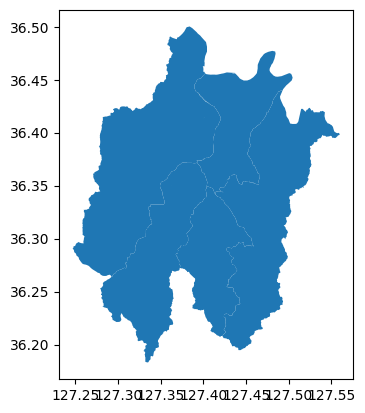

In [24]:
# 데이터 시각화
gu_gdf.plot()
plt.show()

In [25]:
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point


# 교통사고 데이터의 공간 데이터 포인트 생성
dj_acc['geometry'] = dj_acc.apply(
    lambda row: Point(row['lon'], row['lat']), axis=1)
traffic_accident_gu_gdf = gpd.GeoDataFrame(dj_acc, geometry='geometry')

# 공간 조인 수행
acc_gu_gdf = gpd.sjoin(traffic_accident_gu_gdf, gu_gdf, how='left', predicate='within')

/tmp/ipykernel_455418/3060248254.py:12: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: None
Right CRS: EPSG:4326

  acc_gu_gdf = gpd.sjoin(traffic_accident_gu_gdf, gu_gdf, how='left', predicate='within')


In [26]:
acc_gu_gdf

,ACC_YMD,HOUR,DAY_CD,BJD_CD,WEA_STA_CD,ACC_GRD_CD,DEATH_CNT,WND_CNT,lon,lat,geometry,index_right,COL_ADM_SE,EMD_NM
0,2019-01-01,3,3,3.020013e+09,1,3,0,1,127.372955,36.407769,POINT (127.37296 36.40777),3.0,30200,유성구
1,2019-01-01,12,3,3.011010e+09,1,2,0,1,127.454109,36.306999,POINT (127.45411 36.30700),0.0,30110,동구
2,2019-01-01,13,3,3.014010e+09,1,3,0,1,127.415028,36.333411,POINT (127.41503 36.33341),1.0,30140,중구
3,2019-01-01,13,3,3.020011e+09,1,3,0,1,127.332033,36.351625,POINT (127.33203 36.35162),3.0,30200,유성구
4,2019-01-01,18,3,3.020014e+09,2,4,0,1,127.313203,36.391300,POINT (127.31320 36.39130),3.0,30200,유성구
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8332,2019-12-31,20,3,3.014011e+09,1,2,0,1,127.435187,36.316078,POINT (127.43519 36.31608),1.0,30140,중구
8333,2019-12-31,22,3,3.020011e+09,1,3,0,3,127.346471,36.348741,POINT (127.34647 36.34874),3.0,30200,유성구
8334,2019-12-31,22,3,3.023012e+09,1,3,0,3,127.420927,36.427734,POINT (127.42093 36.42773),4.0,30230,대덕구
8335,2019-12-31,22,3,3.020014e+09,1,2,0,1,127.311831,36.396221,POINT (127.31183 36.39622),3.0,30200,유성구


# COL_ADM_SE의 값중에 nan값 3개 발견 전처리

In [27]:
# 'COL_ADM_SE' 열에서 nan 값을 가진 행을 제거
acc_gu_gdf = acc_gu_gdf.dropna(subset=['COL_ADM_SE'])

# 결과 확인
print(acc_gu_gdf['COL_ADM_SE'].unique())


['30200' '30110' '30140' '30170' '30230']


In [28]:
acc_gu_gdf

,ACC_YMD,HOUR,DAY_CD,BJD_CD,WEA_STA_CD,ACC_GRD_CD,DEATH_CNT,WND_CNT,lon,lat,geometry,index_right,COL_ADM_SE,EMD_NM
0,2019-01-01,3,3,3.020013e+09,1,3,0,1,127.372955,36.407769,POINT (127.37296 36.40777),3.0,30200,유성구
1,2019-01-01,12,3,3.011010e+09,1,2,0,1,127.454109,36.306999,POINT (127.45411 36.30700),0.0,30110,동구
2,2019-01-01,13,3,3.014010e+09,1,3,0,1,127.415028,36.333411,POINT (127.41503 36.33341),1.0,30140,중구
3,2019-01-01,13,3,3.020011e+09,1,3,0,1,127.332033,36.351625,POINT (127.33203 36.35162),3.0,30200,유성구
4,2019-01-01,18,3,3.020014e+09,2,4,0,1,127.313203,36.391300,POINT (127.31320 36.39130),3.0,30200,유성구
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8332,2019-12-31,20,3,3.014011e+09,1,2,0,1,127.435187,36.316078,POINT (127.43519 36.31608),1.0,30140,중구
8333,2019-12-31,22,3,3.020011e+09,1,3,0,3,127.346471,36.348741,POINT (127.34647 36.34874),3.0,30200,유성구
8334,2019-12-31,22,3,3.023012e+09,1,3,0,3,127.420927,36.427734,POINT (127.42093 36.42773),4.0,30230,대덕구
8335,2019-12-31,22,3,3.020014e+09,1,2,0,1,127.311831,36.396221,POINT (127.31183 36.39622),3.0,30200,유성구


In [29]:
import geopandas as gpd
import folium

# 구별 색상 딕셔너리 생성
district_colors = {
    '동구': 'blue',
    '중구': 'green',
    '서구': 'red',
    '유성구': 'purple',
    '대덕구': 'orange'
}

# 기본 지도 생성
map = folium.Map(location=[36.35, 127.35], zoom_start=12)

# 경계면 추가
for _, row in gu_gdf.iterrows():
    # Simplify geometry for faster rendering
    simplified_geom = row['geometry'].simplify(0.001, preserve_topology=False)
    district_name = row['EMD_NM']
    color = district_colors.get(district_name, 'gray')  # 'gray'는 딕셔너리에 없는 경우 기본 색상
    folium.GeoJson(
        simplified_geom,
        name=district_name,
        style_function=lambda x, color=color: {'fillColor': color, 'color': color, 'weight': 0.5}
    ).add_to(map)

# 교통사고 위치 추가
for _, row in acc_gu_gdf.iterrows():
    # 구별 색상을 가져옴, 기본 색상은 'gray'
    marker_color = district_colors.get(row['EMD_NM'], 'gray')
    
    folium.CircleMarker(
        location=[row.geometry.y, row.geometry.x],
        radius=5,
        color=marker_color,
        fill=True,
        fill_color=marker_color,
        fill_opacity=0.7
    ).add_to(map)

# 지도 객체 반환
map


# 법정동 공간조인 = acc_gdf, 구 공간조인 = acc_gu_gdf

In [30]:
import pandas as pd

# 'ACC_YMD' 컬럼을 datetime 타입으로 변환
acc_gdf['ACC_YMD'] = pd.to_datetime(acc_gdf['ACC_YMD'])

# 'ACC_YMD' 컬럼에서 월을 추출하여 1월인 행들만 필터링
january_accidents = acc_gdf[acc_gdf['ACC_YMD'].dt.month == 1]

january_accidents

,ACC_YMD,HOUR,DAY_CD,BJD_CD,WEA_STA_CD,ACC_GRD_CD,DEATH_CNT,WND_CNT,lon,lat,geometry,index_right,EMD_CD,COL_ADM_SE,EMD_NM,SGG_OID
0,2019-01-01,3,3,3.020013e+09,1,3,0,1,127.372955,36.407769,POINT (127.37296 36.40777),126.0,30200129,30200,방현동,1602.0
1,2019-01-01,12,3,3.011010e+09,1,2,0,1,127.454109,36.306999,POINT (127.45411 36.30700),4.0,30110105,30110,가오동,1480.0
2,2019-01-01,13,3,3.014010e+09,1,3,0,1,127.415028,36.333411,POINT (127.41503 36.33341),47.0,30140103,30140,목동,761.0
3,2019-01-01,13,3,3.020011e+09,1,3,0,1,127.332033,36.351625,POINT (127.33203 36.35162),109.0,30200112,30200,구암동,1585.0
4,2019-01-01,18,3,3.020014e+09,2,4,0,1,127.313203,36.391300,POINT (127.31320 36.39130),136.0,30200139,30200,반석동,1612.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
599,2019-01-31,18,5,3.023011e+09,1,3,0,1,127.423950,36.451023,POINT (127.42395 36.45102),161.0,30230111,30230,석봉동,1637.0
600,2019-01-31,18,5,3.011014e+09,1,3,0,1,127.460207,36.295931,POINT (127.46021 36.29593),38.0,30110139,30110,대성동,1514.0
601,2019-01-31,18,5,3.011012e+09,1,3,0,1,127.423104,36.335256,POINT (127.42310 36.33526),46.0,30140102,30140,선화동,760.0
602,2019-01-31,20,5,3.017011e+09,1,3,0,2,127.379549,36.355685,POINT (127.37955 36.35568),81.0,30170112,30170,둔산동,1557.0


In [31]:
import pandas as pd

# 'ACC_YMD' 컬럼을 datetime 타입으로 변환
acc_gdf['ACC_YMD'] = pd.to_datetime(acc_gdf['ACC_YMD'])

# 'ACC_YMD' 컬럼에서 월을 추출하여 1월인 행들만 필터링
december_accidents = acc_gdf[acc_gdf['ACC_YMD'].dt.month == 12]

december_accidents


,ACC_YMD,HOUR,DAY_CD,BJD_CD,WEA_STA_CD,ACC_GRD_CD,DEATH_CNT,WND_CNT,lon,lat,geometry,index_right,EMD_CD,COL_ADM_SE,EMD_NM,SGG_OID
7651,2019-12-01,1,1,3.017011e+09,1,2,0,1,127.377447,36.359965,POINT (127.37745 36.35997),82.0,30170113,30170,월평동,1558.0
7652,2019-12-01,9,1,3.017011e+09,1,3,0,1,127.388865,36.341513,POINT (127.38886 36.34151),77.0,30170108,30170,괴정동,1553.0
7653,2019-12-01,11,1,3.014012e+09,1,2,0,1,127.388664,36.302539,POINT (127.38866 36.30254),61.0,30140117,30140,산성동,1537.0
7654,2019-12-01,12,1,3.014010e+09,3,2,0,1,127.425486,36.325926,POINT (127.42549 36.32593),49.0,30140105,30140,대흥동,1525.0
7655,2019-12-01,14,1,3.017011e+09,3,2,0,4,127.378255,36.349283,POINT (127.37826 36.34928),81.0,30170112,30170,둔산동,1557.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8332,2019-12-31,20,3,3.014011e+09,1,2,0,1,127.435187,36.316078,POINT (127.43519 36.31608),55.0,30140111,30140,부사동,1531.0
8333,2019-12-31,22,3,3.020011e+09,1,3,0,3,127.346471,36.348741,POINT (127.34647 36.34874),108.0,30200111,30200,봉명동,1788.0
8334,2019-12-31,22,3,3.023012e+09,1,3,0,3,127.420927,36.427734,POINT (127.42093 36.42773),166.0,30230116,30230,상서동,1642.0
8335,2019-12-31,22,3,3.020014e+09,1,2,0,1,127.311831,36.396221,POINT (127.31183 36.39622),136.0,30200139,30200,반석동,1612.0


In [32]:
# import folium


# # 대전 지역을 중심으로 지도 생성
# map = folium.Map(location=[36.351, 127.385], zoom_start=12)

# # dj_acc 데이터프레임의 각 행에 대해 마커 추가
# for index, row in dj_acc.iterrows():
#     folium.Marker([row['lat'], row['lon']]).add_to(map)

# # 지도 표시
# map


In [33]:
pd.DataFrame(acc_gdf.groupby('EMD_NM').size().sort_values(ascending = False)).head(24)

,0
EMD_NM,
둔산동,666
봉명동,411
월평동,339
갈마동,325
탄방동,256
가양동,195
장대동,191
용전동,191
도마동,169


# join_processing.ipynb에 전처리해서 pickle저장해놓음
### pickle불러오기

In [35]:
import pandas as pd

# 각 DTG 데이터프레임을 불러옵니다
dtg_dataframes = {}
for i in range(1, 13):
    dtg_var_name = f'GEO_DTG_{i:02d}'
    dtg_dataframes[dtg_var_name] = pd.read_pickle(f'/home/user/jin_jb/DTG/DATA/{dtg_var_name}.pkl')

# 예시: DTG_01 데이터프레임에 접근
GEO_DTG_01 = dtg_dataframes['GEO_DTG_01']
GEO_DTG_02 = dtg_dataframes['GEO_DTG_02']
GEO_DTG_03 = dtg_dataframes['GEO_DTG_03']
GEO_DTG_04 = dtg_dataframes['GEO_DTG_04']
GEO_DTG_05 = dtg_dataframes['GEO_DTG_05']
GEO_DTG_06 = dtg_dataframes['GEO_DTG_06']
GEO_DTG_07 = dtg_dataframes['GEO_DTG_07']
GEO_DTG_08 = dtg_dataframes['GEO_DTG_08']
GEO_DTG_09 = dtg_dataframes['GEO_DTG_09']
GEO_DTG_10 = dtg_dataframes['GEO_DTG_10']
GEO_DTG_11 = dtg_dataframes['GEO_DTG_11']
GEO_DTG_12 = dtg_dataframes['GEO_DTG_12']

import pandas as pd

df_list = [GEO_DTG_01, GEO_DTG_02, GEO_DTG_03, GEO_DTG_04, GEO_DTG_05, 
           GEO_DTG_06, GEO_DTG_07, GEO_DTG_08, GEO_DTG_09, GEO_DTG_10, 
           GEO_DTG_11, GEO_DTG_12]

GEO_DTG = pd.concat(df_list, ignore_index=True)

GEO_DTG

,OPT_DT,HOUR,TRANSCO_CD,CAR_REG_NO,TRIP_ID,OPT_SPD,Speeding,Long-term speeding,Sudden acceleration,Sudden start,...,Sudden overtaking,Sudden lane change,EMD_CD,EMD_NM,DAY_CD,ACC_GRD_CD,DEATH_CNT,WND_CNT,lon,lat
0,2019-01-01,19,17827,대전50바8429,C대전50바842919010117303000,26,0,0,1,0,...,0,0,30170112,둔산동,3,1,1,0,127.379560,36.355946
1,2019-01-01,19,17827,대전50바8429,C대전50바842919010117303000,90,1,0,0,0,...,0,0,30170112,둔산동,3,1,1,0,127.379560,36.355946
2,2019-01-01,18,17821,대전50바7636,C대전50바763619010103514200,60,0,0,0,0,...,0,0,30170112,둔산동,3,3,0,2,127.379281,36.355766
3,2019-01-01,18,17821,대전50바7636,C대전50바763619010103514200,60,0,0,0,0,...,0,0,30170112,둔산동,3,3,0,2,127.379281,36.355766
4,2019-01-01,19,17821,대전50바7636,C대전50바763619010103514200,60,0,0,0,0,...,0,0,30170112,둔산동,3,1,1,0,127.379560,36.355946
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1863692,2019-12-31,11,29525,대구84아9597,C대구84아959719123110140000,146,0,0,0,0,...,0,0,30200130,화암동,3,3,0,1,127.377793,36.416744
1863693,2019-12-31,11,29525,대구84아9597,C대구84아959719123110140000,71,1,0,0,0,...,0,0,30200130,화암동,3,3,0,1,127.377793,36.416744
1863694,2019-12-31,10,29787,인천85아1835,C인천85아183519123110330000,15,0,0,1,0,...,0,0,30170116,관저동,3,2,0,2,127.334089,36.301538
1863695,2019-12-31,10,29787,인천85아1835,C인천85아183519123110330000,18,0,0,1,0,...,0,0,30170116,관저동,3,2,0,2,127.334089,36.301538


In [ ]:
# GEO_DTG.to_pickle('/home/user/jin_jb/DTG/DATA/GEO_DTG.pkl')

In [36]:
import pandas as pd
GEO_DTG = pd.read_pickle('/home/user/jin_jb/DTG/DATA/GEO_DTG.pkl')

In [37]:
GEO_DTG

,OPT_DT,HOUR,TRANSCO_CD,CAR_REG_NO,TRIP_ID,OPT_SPD,Speeding,Long-term speeding,Sudden acceleration,Sudden start,...,Sudden overtaking,Sudden lane change,EMD_CD,EMD_NM,DAY_CD,ACC_GRD_CD,DEATH_CNT,WND_CNT,lon,lat
0,2019-01-01,19,17827,대전50바8429,C대전50바842919010117303000,26,0,0,1,0,...,0,0,30170112,둔산동,3,1,1,0,127.379560,36.355946
1,2019-01-01,19,17827,대전50바8429,C대전50바842919010117303000,90,1,0,0,0,...,0,0,30170112,둔산동,3,1,1,0,127.379560,36.355946
2,2019-01-01,18,17821,대전50바7636,C대전50바763619010103514200,60,0,0,0,0,...,0,0,30170112,둔산동,3,3,0,2,127.379281,36.355766
3,2019-01-01,18,17821,대전50바7636,C대전50바763619010103514200,60,0,0,0,0,...,0,0,30170112,둔산동,3,3,0,2,127.379281,36.355766
4,2019-01-01,19,17821,대전50바7636,C대전50바763619010103514200,60,0,0,0,0,...,0,0,30170112,둔산동,3,1,1,0,127.379560,36.355946
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1863692,2019-12-31,11,29525,대구84아9597,C대구84아959719123110140000,146,0,0,0,0,...,0,0,30200130,화암동,3,3,0,1,127.377793,36.416744
1863693,2019-12-31,11,29525,대구84아9597,C대구84아959719123110140000,71,1,0,0,0,...,0,0,30200130,화암동,3,3,0,1,127.377793,36.416744
1863694,2019-12-31,10,29787,인천85아1835,C인천85아183519123110330000,15,0,0,1,0,...,0,0,30170116,관저동,3,2,0,2,127.334089,36.301538
1863695,2019-12-31,10,29787,인천85아1835,C인천85아183519123110330000,18,0,0,1,0,...,0,0,30170116,관저동,3,2,0,2,127.334089,36.301538


In [38]:
len(GEO_DTG['TRANSCO_CD'].unique())

3487

In [39]:
import pandas as pd
pd.read_csv("/home/user/jin_jb/DTG/DATA/AI모델자료/DMS_TRATB_REPT01.csv",sep='\t')

,CORP_CD,REPORT_YM,REPORT_TYPE,LICENSE_CAR_CNT,CAR_CNT,CUR_DRIVER_CNT,ENTRY_CNT1,ENTRY_CNT2,RETIRE_CNT,CHANGE_CNT,...,SIGN_DATE,REJECT_REASON,CORP_ADDR,CORP_BUSINESS_DIV,SYS_REG_ID,SYS_REG_DATE,SYS_UPD_ID,SYS_UPD_DATE,ETL_RGST_ID,ETL_REG_DT
0,24618,201601,1,30.0,30.0,30.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,3068124044,2016-01-11 15:18:26.000350,3068124044,2016-01-11 15:18:26.000350,ETLDSADM,2016-03-24 20:37:13.000000
1,24618,201602,1,30.0,30.0,30.0,0.0,3.0,2.0,1.0,...,NaN,NaN,NaN,NaN,parkdm77,2016-02-02 15:35:54.000450,parkdm77,2016-02-02 15:47:32.000883,ETLDSADM,2016-03-24 20:37:13.000000
2,24618,201603,1,30.0,30.0,30.0,0.0,0.0,1.0,0.0,...,NaN,NaN,NaN,NaN,parkdm77,2016-03-11 09:10:05.000727,parkdm77,2016-03-11 09:10:05.000727,ETLDSADM,2016-03-24 20:37:13.000000
3,29079,201601,1,5.0,5.0,5.0,0.0,0.0,1.0,0.0,...,NaN,NaN,NaN,NaN,hbta2012,2016-01-19 14:14:12.000827,hbta2012,2016-01-19 14:14:12.000827,ETLDSADM,2016-03-24 20:37:13.000000
4,24618,201604,1,30.0,30.0,30.0,0.0,0.0,1.0,0.0,...,NaN,NaN,NaN,NaN,parkdm77,2016-04-19 13:45:13.000127,parkdm77,2016-04-19 13:45:13.000127,ETLDSADM,2016-04-20 02:06:02.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12792,26496,202010,1,15.0,15.0,16.0,0.0,0.0,2.0,0.0,...,NaN,NaN,NaN,NaN,djta01,2020-10-15 13:19:36.000177,djta01,2020-10-15 13:19:36.000177,ETLDSADM,2021-06-08 02:55:11.000000
12793,26496,202012,1,15.0,15.0,15.0,0.0,2.0,3.0,0.0,...,NaN,NaN,NaN,NaN,djta01,2020-12-01 09:42:39.000863,djta01,2020-12-01 09:42:39.000863,ETLDSADM,2021-06-08 02:55:11.000000
12794,26496,202102,1,15.0,15.0,15.0,1.0,0.0,1.0,0.0,...,NaN,NaN,NaN,NaN,djta02,2021-02-18 10:43:54.000453,djta02,2021-02-18 10:43:54.000453,ETLDSADM,2021-06-08 02:55:11.000000
12795,26496,202104,1,15.0,15.0,15.0,1.0,0.0,2.0,0.0,...,NaN,NaN,NaN,NaN,djta01,2021-04-28 16:25:58.000207,djta01,2021-04-28 16:25:58.000207,ETLDSADM,2021-06-08 02:55:11.000000


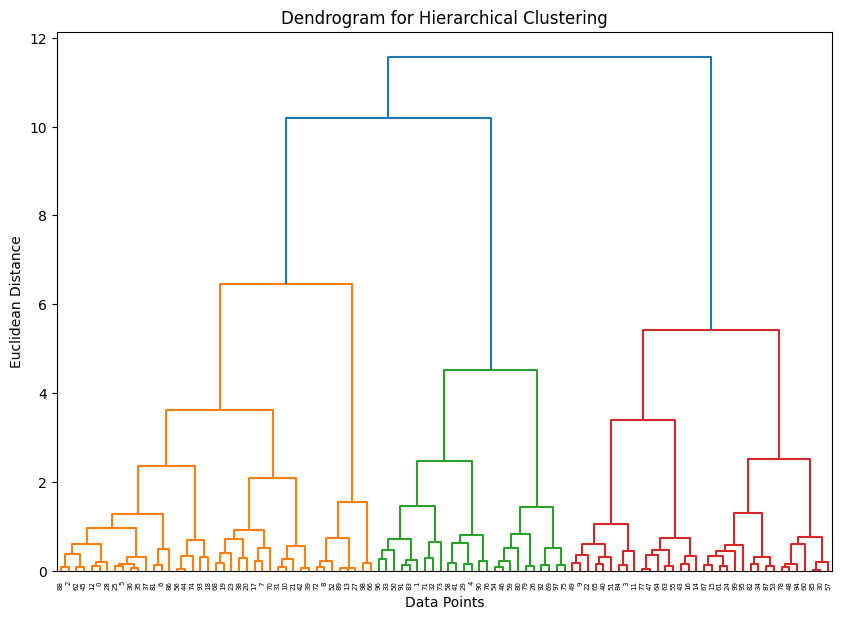

In [42]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from scipy.cluster.hierarchy import dendrogram, linkage
import matplotlib.pyplot as plt

# 예시 데이터 생성
np.random.seed(0)
lon = np.random.uniform(127.3, 127.4, 100)  # 경도
lat = np.random.uniform(36.3, 36.4, 100)  # 위도
speeding = np.random.randint(0, 2, 100)  # 과속 여부
sudden_acceleration = np.random.randint(0, 2, 100)  # 급가속

data = pd.DataFrame({
    'lon': lon,
    'lat': lat,
    'Speeding': speeding,
    'Sudden_acceleration': sudden_acceleration
})

# 데이터 전처리: 경도와 위도 데이터 표준화
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data[['lon', 'lat']])

# Hierarchical Clustering
linked = linkage(data_scaled, 'ward')

# 덴드로그램 그리기
plt.figure(figsize=(10, 7))
dendrogram(linked, orientation='top', distance_sort='descending', show_leaf_counts=True)
plt.title('Dendrogram for Hierarchical Clustering')
plt.xlabel('Data Points')
plt.ylabel('Euclidean Distance')
plt.show()


In [43]:
import pandas as pd

GEO_DTG = pd.read_pickle("/home/user/jin_jb/DTG/DATA/GEO_DTG.pkl")

GEO_DTG_spot = GEO_DTG[['lon','lat']]

In [44]:
GEO_DTG_spot

,lon,lat
0,127.379560,36.355946
1,127.379560,36.355946
2,127.379281,36.355766
3,127.379281,36.355766
4,127.379560,36.355946
...,...,...
1863692,127.377793,36.416744
1863693,127.377793,36.416744
1863694,127.334089,36.301538
1863695,127.334089,36.301538


In [ ]:
from sklearn.cluster import DBSCAN
import geopandas as gpd
import folium
import numpy as np
import pandas as pd

# 예시 데이터 생성
np.random.seed(1)
example_lon = np.random.uniform(127.3, 127.4, 100)  # 대전 지역 경도 범위
example_lat = np.random.uniform(36.3, 36.4, 100)  # 대전 지역 위도 범위
example_data = pd.DataFrame({
    'lon': example_lon,
    'lat': example_lat
})

# DBSCAN 클러스터링
# eps: 이웃을 정의하기 위한 최대 거리, min_samples: 핵심 포인트를 정의하기 위한 이웃 수
dbscan = DBSCAN(eps=0.01, min_samples=5)
example_data['Cluster'] = dbscan.fit_predict(example_data[['lon', 'lat']])

# 클러스터링 결과 시각화 (수정)
map = folium.Map(location=[36.35, 127.35], zoom_start=13)
colors = ['red', 'green', 'blue', 'purple', 'orange', 'darkred', 'lightred', 'beige', 'darkblue', 'darkgreen', 'cadetblue', 'darkpurple', 'white', 'pink', 'lightblue', 'lightgreen', 'gray', 'black', 'lightgray']

for _, row in example_data.iterrows():
    cluster = int(row['Cluster'])  # 클러스터 값을 int로 변환
    # 클러스터가 -1인 경우 (잡음), 검은색으로 표시
    color = 'black' if cluster == -1 else colors[cluster % len(colors)]
    
    folium.CircleMarker(
        
        location=[row['lat'], row['lon']],
        radius=5,
        color=color,
        fill=True,
        fill_color=color
    ).add_to(map)

map


In [ ]:
from sklearn.cluster import DBSCAN
import geopandas as gpd
import folium

# DBSCAN 클러스터링
dbscan = DBSCAN(eps=0.0018, min_samples=5)  # 파라미터는 데이터에 따라 조정 필요
spot['Cluster'] = dbscan.fit_predict(spot[['lon', 'lat']])

# 클러스터링 결과 시각화
map = folium.Map(location=[36.35, 127.38], zoom_start=11)  # 대전 지역을 중심으로 설정
colors = ['red', 'green', 'blue', 'purple', 'orange', 'darkred', 'lightred', 'beige', 'darkblue', 'darkgreen', 'cadetblue', 'darkpurple', 'white', 'pink', 'lightblue', 'lightgreen', 'gray', 'black', 'lightgray']

for _, row in spot.iterrows():
    cluster = int(row['Cluster'])
    color = 'gray' if cluster == -1 else colors[cluster % len(colors)]  # 잡음은 회색, 클러스터는 파란색으로 표시
    
    folium.CircleMarker(
        location=[row['lat'], row['lon']],
        radius=2,
        color=color,
        fill=True,
        fill_color=color
    ).add_to(map)

map


/tmp/ipykernel_123109/1372901786.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  spot['Cluster'] = dbscan.fit_predict(spot[['lon', 'lat']])


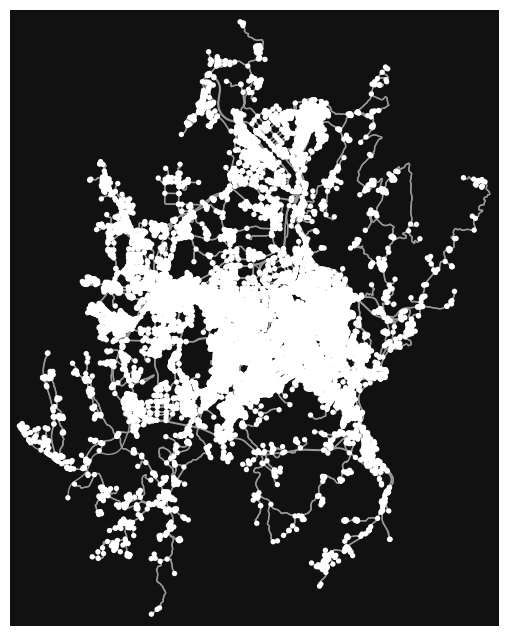

(<Figure size 800x800 with 1 Axes>, <Axes: >)

In [ ]:
import osmnx as ox

# 관심 지역의 도로 네트워크 다운로드
place_name = "Daejeon, South Korea"
graph = ox.graph_from_place(place_name, network_type='drive')
roads_gdf = ox.graph_to_gdfs(graph, nodes=False)

# 도로 네트워크 시각화
ox.plot_graph(ox.project_graph(graph))

/tmp/ipykernel_338848/737512292.py:13: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  gdf_edges['geometry'] = gdf_edges.geometry.buffer(0.0001)  # 대략 10m 폭, 좌표계에 따라 조정 필요


<Axes: >

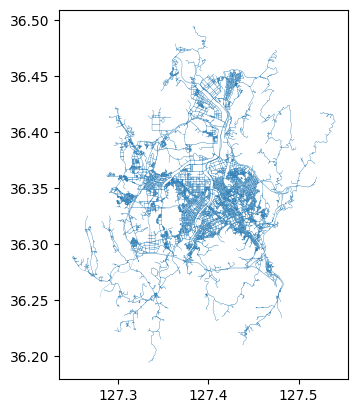

In [ ]:
import osmnx as ox
import geopandas as gpd

# 대전 지역의 도로 네트워크 다운로드
place_name = "Daejeon, South Korea"
graph = ox.graph_from_place(place_name, network_type='drive')

# 그래프에서 노드와 엣지를 GeoDataFrame으로 변환
gdf_nodes, gdf_edges = ox.graph_to_gdfs(graph)

# 각 도로 세그먼트에 대한 버퍼 생성 (예: 도로 폭을 고려한 버퍼)
# 여기서는 단순화를 위해 모든 도로에 대해 동일한 폭(예: 10m)을 가정
gdf_edges['geometry'] = gdf_edges.geometry.buffer(0.0001)  # 대략 10m 폭, 좌표계에 따라 조정 필요

# 버퍼링된 도로 경계 확인
gdf_edges.plot()

# # 필요시 GeoDataFrame을 파일로 저장
# gdf_edges.to_file("daejeon_road_boundaries.geojson", driver='GeoJSON')


In [ ]:
# 도로 네트워크 확인
roads_gdf = roads_gdf.reset_index()

In [ ]:
roads_gdf

,u,v,key,osmid,oneway,lanes,highway,maxspeed,reversed,length,geometry,name,ref,bridge,tunnel,access,junction
0,274940138,8234413963,0,124013597,True,1,motorway_link,40,False,260.691,"LINESTRING (127.37828 36.41666, 127.37915 36.4...",NaN,NaN,NaN,NaN,NaN,NaN
1,275898514,8964537398,0,124013597,True,1,motorway_link,40,False,17.568,"LINESTRING (127.37769 36.41697, 127.37781 36.4...",NaN,NaN,NaN,NaN,NaN,NaN
2,275898514,436793845,0,37397677,False,NaN,residential,NaN,False,462.029,"LINESTRING (127.37769 36.41697, 127.37764 36.4...",대덕대로989번길,NaN,NaN,NaN,NaN,NaN
3,275898514,8234413994,0,124013611,True,NaN,secondary,NaN,False,650.453,"LINESTRING (127.37769 36.41697, 127.37767 36.4...",대덕대로,32;57,NaN,NaN,NaN,NaN
4,275898563,8234413970,0,774882403,True,4,secondary,60,False,411.024,"LINESTRING (127.37784 36.41119, 127.37802 36.4...",대덕대로,32;57,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
43458,11515615424,387271437,0,470198454,False,4,secondary,70,False,259.858,"LINESTRING (127.39070 36.35977, 127.39204 36.3...",청사로,NaN,NaN,NaN,NaN,NaN
43459,11515615424,278125515,0,1239558233,True,4,secondary,70,False,39.452,"LINESTRING (127.39070 36.35977, 127.39053 36.3...",청사로,NaN,NaN,NaN,NaN,NaN
43460,11515615426,278125515,0,1239558235,False,4,secondary,70,True,8.162,"LINESTRING (127.39027 36.35973, 127.39027 36.3...",문예로,NaN,NaN,NaN,NaN,NaN
43461,11515615426,387271429,0,979941396,False,4,secondary,70,False,109.861,"LINESTRING (127.39027 36.35973, 127.39027 36.3...",문예로,NaN,NaN,NaN,NaN,NaN


In [ ]:
import geopandas as gpd
from shapely.geometry import Point

# 교통사고 데이터를 GeoDataFrame으로 변환
accidents_gdf = gpd.GeoDataFrame(GEO_DTG, geometry=gpd.points_from_xy(GEO_DTG.lon, GEO_DTG.lat))


# 공간 조인을 통해 각 사고가 발생한 도로 식별
joined_data = gpd.sjoin(accidents_gdf, roads_gdf, how="inner", op='intersects')

# 결과 분석 및 처리


/home/user/.local/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3448: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if await self.run_code(code, result, async_=asy):
/tmp/ipykernel_338848/4261208317.py:9: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: None
Right CRS: EPSG:4326

  joined_data = gpd.sjoin(accidents_gdf, roads_gdf, how="inner", op='intersects')


In [ ]:
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point
import osmnx as ox

# 교통사고 데이터를 GeoDataFrame으로 변환
accidents_gdf = gpd.GeoDataFrame(GEO_DTG, geometry=gpd.points_from_xy(GEO_DTG.lon, GEO_DTG.lat))

# OSMnx를 사용하여 도로 네트워크 데이터 가져오기
place_name = "Daejeon, South Korea"
graph = ox.graph_from_place(place_name, network_type='drive')
roads_gdf = ox.graph_to_gdfs(graph, nodes=False)

# accidents_gdf의 좌표계 설정 (도로 네트워크 데이터와 일치시키기)
accidents_gdf.set_crs(roads_gdf.crs, inplace=True)

# 공간 조인을 통해 각 사고가 발생한 도로 식별
joined_data = gpd.sjoin(accidents_gdf, roads_gdf, how="inner", predicate='intersects')


In [ ]:
accidents_gdf

,OPT_DT,HOUR,TRANSCO_CD,CAR_REG_NO,TRIP_ID,OPT_SPD,Speeding,Long-term speeding,Sudden acceleration,Sudden start,...,Sudden lane change,EMD_CD,EMD_NM,DAY_CD,ACC_GRD_CD,DEATH_CNT,WND_CNT,lon,lat,geometry
0,2019-01-01,19,17827,대전50바8429,C대전50바842919010117303000,26,0,0,1,0,...,0,30170112,둔산동,3,1,1,0,127.379560,36.355946,POINT (127.37956 36.35595)
1,2019-01-01,19,17827,대전50바8429,C대전50바842919010117303000,90,1,0,0,0,...,0,30170112,둔산동,3,1,1,0,127.379560,36.355946,POINT (127.37956 36.35595)
2,2019-01-01,18,17821,대전50바7636,C대전50바763619010103514200,60,0,0,0,0,...,0,30170112,둔산동,3,3,0,2,127.379281,36.355766,POINT (127.37928 36.35577)
3,2019-01-01,18,17821,대전50바7636,C대전50바763619010103514200,60,0,0,0,0,...,0,30170112,둔산동,3,3,0,2,127.379281,36.355766,POINT (127.37928 36.35577)
4,2019-01-01,19,17821,대전50바7636,C대전50바763619010103514200,60,0,0,0,0,...,0,30170112,둔산동,3,1,1,0,127.379560,36.355946,POINT (127.37956 36.35595)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1863692,2019-12-31,11,29525,대구84아9597,C대구84아959719123110140000,146,0,0,0,0,...,0,30200130,화암동,3,3,0,1,127.377793,36.416744,POINT (127.37779 36.41674)
1863693,2019-12-31,11,29525,대구84아9597,C대구84아959719123110140000,71,1,0,0,0,...,0,30200130,화암동,3,3,0,1,127.377793,36.416744,POINT (127.37779 36.41674)
1863694,2019-12-31,10,29787,인천85아1835,C인천85아183519123110330000,15,0,0,1,0,...,0,30170116,관저동,3,2,0,2,127.334089,36.301538,POINT (127.33409 36.30154)
1863695,2019-12-31,10,29787,인천85아1835,C인천85아183519123110330000,18,0,0,1,0,...,0,30170116,관저동,3,2,0,2,127.334089,36.301538,POINT (127.33409 36.30154)


In [ ]:
group_geo = GEO_DTG.groupby(['OPT_DT','HOUR','EMD_NM'])

In [ ]:
columns_of_interest = [
    "Speeding", "Long-term speeding", "Sudden acceleration", "Sudden start", "Sudden deceleration", "Sudden stop", 
    "Sudden left turn", "Sudden right turn", "Sudden U-turn", "Sudden overtaking", "Sudden lane change"
]

GEO_DTG_total = pd.DataFrame(group_geo[columns_of_interest].sum()).reset_index()

GEO_DTG_total

,OPT_DT,HOUR,EMD_NM,Speeding,Long-term speeding,Sudden acceleration,Sudden start,Sudden deceleration,Sudden stop,Sudden left turn,Sudden right turn,Sudden U-turn,Sudden overtaking,Sudden lane change
0,2019-01-01,3,방현동,1,0,1,0,3,0,0,1,0,0,0
1,2019-01-01,12,가오동,7,0,62,0,13,3,6,3,2,5,7
2,2019-01-01,13,구암동,71,0,121,0,24,4,6,3,0,1,8
3,2019-01-01,13,목동,33,0,39,0,5,1,0,0,0,0,1
4,2019-01-01,18,둔산동,167,0,863,2,97,37,23,9,2,8,39
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8202,2019-12-31,17,둔산동,0,0,2,0,0,0,0,0,0,0,0
8203,2019-12-31,17,용산동,1,0,0,0,0,0,0,0,0,0,0
8204,2019-12-31,18,문화동,0,0,4,0,0,0,0,0,0,0,0
8205,2019-12-31,20,대흥동,0,0,2,0,0,0,0,0,0,0,0


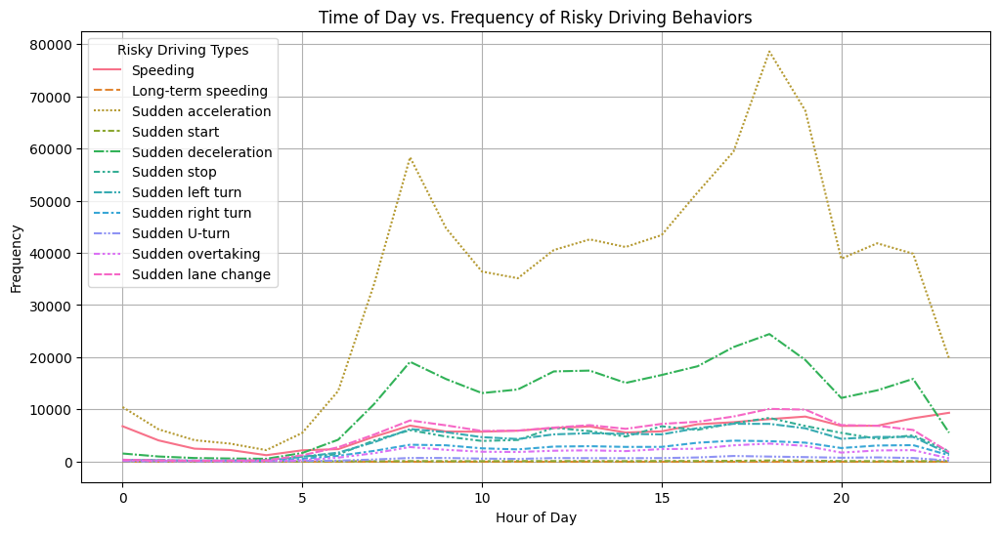

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# 시간대별 위험운전 유형 분석을 위한 데이터 준비
# 주요 위험운전 유형 몇 가지를 선택
selected_risk_driving_types = ["Speeding", "Long-term speeding", "Sudden acceleration", "Sudden start", "Sudden deceleration", "Sudden stop", 
    "Sudden left turn", "Sudden right turn", "Sudden U-turn", "Sudden overtaking", "Sudden lane change"]
hourly_risk_driving_data = GEO_DTG_total.groupby('HOUR')[selected_risk_driving_types].sum()

# 시간대별 위험운전 유형 그래프
plt.figure(figsize=(12, 6))
ax = sns.lineplot(data=hourly_risk_driving_data)  # ax는 생성된 Axes 객체입니다.
plt.title('Time of Day vs. Frequency of Risky Driving Behaviors')
plt.xlabel('Hour of Day')
plt.ylabel('Frequency')
ax.legend(title='Risky Driving Types')  # 여기서는 ax에서 레전드를 자동으로 생성하도록 합니다.
plt.grid(True)
plt.show()



In [ ]:
hourly_risk_driving_data

,Speeding,Long-term speeding,Sudden acceleration,Sudden start,Sudden deceleration,Sudden stop,Sudden left turn,Sudden right turn,Sudden U-turn,Sudden overtaking,Sudden lane change
HOUR,,,,,,,,,,,
0,6757,0,10435,44,1529,316,325,245,38,178,333
1,4045,0,6170,38,959,187,248,181,20,95,221
2,2458,0,4087,20,668,92,137,184,16,95,154
3,2196,0,3421,14,573,151,165,171,4,65,172
4,1207,0,2179,11,520,298,126,126,17,70,223
5,2142,0,5483,7,1629,953,907,513,106,231,1190
6,2365,0,13522,38,4172,1350,1696,1079,160,733,2728
7,4752,0,34030,63,11015,4025,3704,2032,382,1587,5163
8,6883,0,58318,77,19111,6008,6220,3211,675,2768,7871


In [ ]:
GEO_DTG_total

,OPT_DT,HOUR,EMD_NM,Speeding,Long-term speeding,Sudden acceleration,Sudden start,Sudden deceleration,Sudden stop,Sudden left turn,Sudden right turn,Sudden U-turn,Sudden overtaking,Sudden lane change
0,2019-01-01,3,방현동,1,0,1,0,3,0,0,1,0,0,0
1,2019-01-01,12,가오동,7,0,62,0,13,3,6,3,2,5,7
2,2019-01-01,13,구암동,71,0,121,0,24,4,6,3,0,1,8
3,2019-01-01,13,목동,33,0,39,0,5,1,0,0,0,0,1
4,2019-01-01,18,둔산동,167,0,863,2,97,37,23,9,2,8,39
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8202,2019-12-31,17,둔산동,0,0,2,0,0,0,0,0,0,0,0
8203,2019-12-31,17,용산동,1,0,0,0,0,0,0,0,0,0,0
8204,2019-12-31,18,문화동,0,0,4,0,0,0,0,0,0,0,0
8205,2019-12-31,20,대흥동,0,0,2,0,0,0,0,0,0,0,0


In [ ]:
GEO_DTG_total.columns

Index(['OPT_DT', 'HOUR', 'EMD_NM', 'Speeding', 'Long-term speeding',
       'Sudden acceleration', 'Sudden start', 'Sudden deceleration',
       'Sudden stop', 'Sudden left turn', 'Sudden right turn', 'Sudden U-turn',
       'Sudden overtaking', 'Sudden lane change'],
      dtype='object')

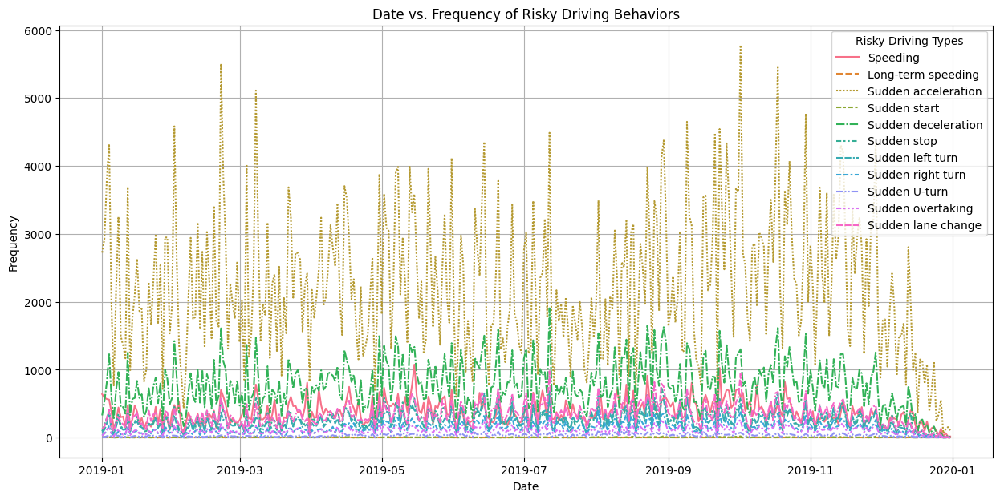

In [ ]:
# 날짜별 추이 분석을 위한 데이터 준비
# 날짜 형식을 datetime으로 변환
GEO_DTG_total['OPT_DT'] = pd.to_datetime(GEO_DTG_total['OPT_DT'])

# 일부 주요 위험운전 유형들의 날짜별 발생 추이
date_risk_driving_data = GEO_DTG_total.groupby('OPT_DT')[selected_risk_driving_types].sum()

# 날짜별 위험운전 유형 그래프
plt.figure(figsize=(15, 7))
ax = sns.lineplot(data=date_risk_driving_data)
plt.title('Date vs. Frequency of Risky Driving Behaviors')
plt.xlabel('Date')
plt.ylabel('Frequency')
ax.legend(title='Risky Driving Types')
plt.grid(True)
plt.show()


In [ ]:
date_risk_driving_data

,Speeding,Long-term speeding,Sudden acceleration,Sudden start,Sudden deceleration,Sudden stop,Sudden left turn,Sudden right turn,Sudden U-turn,Sudden overtaking,Sudden lane change
OPT_DT,,,,,,,,,,,
2019-01-01,640,0,2724,8,327,95,77,36,8,28,127
2019-01-02,587,0,2929,8,537,181,116,59,9,63,161
2019-01-03,569,0,3798,13,811,293,208,96,21,114,285
2019-01-04,560,0,4324,7,1246,378,365,177,32,150,415
2019-01-05,377,0,1974,5,593,169,105,61,19,59,162
...,...,...,...,...,...,...,...,...,...,...,...
2019-12-27,131,0,552,2,73,7,33,24,4,28,41
2019-12-28,18,0,63,1,8,1,1,6,0,2,2
2019-12-29,65,0,123,1,18,0,9,7,0,6,14


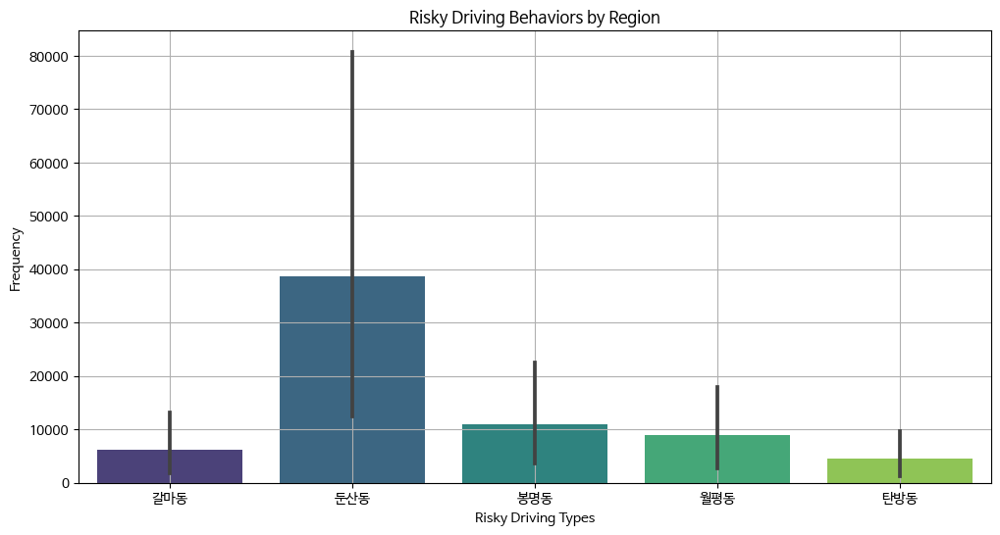

In [ ]:
# 폰트 설정
from matplotlib import font_manager

font_path = '/usr/share/fonts/truetype/nanum/NanumBarunGothic.ttf'  # NanumBarunGothic 폰트 파일 경로
font_prop = font_manager.FontProperties(fname=font_path).get_name()
plt.rcParams['font.family'] = font_prop


columns_of_interest = [
    "Speeding", "Long-term speeding", "Sudden acceleration", "Sudden start", "Sudden deceleration", "Sudden stop", 
    "Sudden left turn", "Sudden right turn", "Sudden U-turn", "Sudden overtaking", "Sudden lane change"
]

# 지역별 위험운전 통계를 위한 데이터 준비
# 대표적인 몇 개의 법정동을 선택
selected_regions = GEO_DTG_total['EMD_NM'].value_counts().nlargest(5).index
region_risk_driving_data = GEO_DTG_total[GEO_DTG_total['EMD_NM'].isin(selected_regions)].groupby('EMD_NM')[columns_of_interest].sum()

# 지역별 위험운전 유형 그래프
plt.figure(figsize=(12, 6))
sns.barplot(data=region_risk_driving_data.T, palette="viridis")
plt.title('Risky Driving Behaviors by Region')
plt.xlabel('Risky Driving Types')
plt.ylabel('Frequency')
# plt.legend(title='Regions', labels=selected_regions)
plt.grid(True)
plt.show()


In [ ]:
region_risk_driving_data.sum(axis = 1)

EMD_NM
갈마동     68294
둔산동    426379
봉명동    119944
월평동     97617
탄방동     50493
dtype: int64